In [1]:
import sys
import os
sys.path.append(os.environ.get('NOTEBOOK_ROOT'))

import datacube
import datetime
import matplotlib.pyplot as plt  
import numpy as np
import pandas as pd
import seaborn as sns 
import xarray as xr

from functools import partial 
from itertools import product
from tqdm import tnrange, tqdm_notebook
from typing import Tuple
from skimage.measure import compare_ssim as ssim
from utils.data_cube_utilities.dc_frac import frac_coverage_classify
from utils.data_cube_utilities.dc_mosaic import create_median_mosaic
from utils.data_cube_utilities.dc_mosaic import ls8_unpack_qa
from utils.data_cube_utilities.dc_rgb import rgb

%matplotlib inline 

ModuleNotFoundError: No module named 'utils.data_cube_utilities.dc_frac'

## Feature Engineering 
The goal of this notebook is to explore new representations of data and highlight their respectice strengths and weaknesses.  



# Building Features

In this section a large raster of training data is loaded, and augmented with newer representations.


The diagram below details a high level over-view of the feature engineering process. Arrows indicate a tranformation from a source representation to a new category of features.  


![image.png]( ./feature_engineering.PNG)  
  
  
###  Median Composite features  
A median composite of spectral bands is used as base representation from which several types of features are engineered.  

Those features include:  
    - spectral bands
        - red,
        - green 
        - blue 
        - nir  
        - swir1 
        - swir2
    
    - spectral indices: 
        - msavi
        - nbr
        - ndvi
        - pndvi  
        
    - spectral unmixing
        - fractional coverage
            - bare soil
            - photosynthetic vegetation 
            - non-photosynthetic vegetation
    

### Variance Composite features 
An alternative to generating features on a yearly composite is to generate a yearly composite for data with these features already generated.  This approach is about generating the feature for the full time range and creating per pixel statistical composites.  

Features and generated statistics: 
    - ndvi
        - coefficient of variance 
        

# Load Data

**Load Labels**

In [2]:
!ls

1. Data Exploration.ipynb
2. Feature Engineering.ipynb
2. Feature Engineering Original.ipynb
3. Model Building and Evaluation.ipynb
3. Model Building and Evaluation Original.ipynb
4. Display and Package Classifier.ipynb
classifiers
engineered_features.csv
engineered_features_original.csv
feature_engineering.PNG
relabeled_data.csv


In [3]:
data = pd.read_csv("relabeled_data.csv")
data.head()

,Unnamed: 0,X,Y,LandUse,Latitude,Longitude
0,0,618522.8899,6218452.029,Forest,-34.168155,-55.714061
1,1,649042.3861,6199719.402,Forest,-34.333113,-55.379803
2,2,655993.6095,6200009.045,Forest,-34.329479,-55.304319
3,3,656440.0958,6200236.666,Forest,-34.327360,-55.299509
4,4,656825.7859,6199755.161,Forest,-34.331642,-55.295231


> ### Area  

In [4]:
latitude = (-34.44988376, -34.096445),
longitude = (-56.29119062, -55.24653668)

> ### Load raster data from the Data Cube

In [5]:
dc = datacube.Datacube()

In [6]:
params = dict(platform = 'LANDSAT_8',
              product   = 'ls8_lasrc_uruguay',
              latitude = (-34.44988376, -34.096445),
              longitude = (-56.29119062, -55.24653668),
              time = ('2016-01-01', '2017-01-01'), 
              measurements = ['red', 'green', 'blue', 'nir', 'swir1', 'swir2', 'pixel_qa'])    

In [7]:
dataset = dc.load(**params)

In [8]:
dataset

<xarray.Dataset>
Dimensions:    (latitude: 1313, longitude: 3877, time: 19)
Coordinates:
  * time       (time) datetime64[ns] 2016-01-09T13:32:20 ... 2016-12-10T13:32:34
  * latitude   (latitude) float64 -34.1 -34.1 -34.1 ... -34.45 -34.45 -34.45
  * longitude  (longitude) float64 -56.29 -56.29 -56.29 ... -55.25 -55.25 -55.25
Data variables:
    red        (time, latitude, longitude) int16 421 454 471 487 ... 795 849 879
    green      (time, latitude, longitude) int16 722 726 735 754 ... 845 890 865
    blue       (time, latitude, longitude) int16 334 346 353 360 ... 432 450 459
    nir        (time, latitude, longitude) int16 4679 4298 4235 ... 3753 3736
    swir1      (time, latitude, longitude) int16 2538 2646 2675 ... 3020 3001
    swir2      (time, latitude, longitude) int16 1189 1286 1345 ... 1685 1660
    pixel_qa   (time, latitude, longitude) int32 322 322 322 322 ... 322 322 322
Attributes:
    crs:      EPSG:4326

# Median composite

In [9]:
def clean_mask_ls8(ds):
    water_mask = ls8_unpack_qa(ds.pixel_qa, cover_type = "water")
    clear_mask = ls8_unpack_qa(ds.pixel_qa, cover_type = "clear")
    clean_mask = np.logical_or(water_mask, clear_mask)
    return clean_mask

def create_temporal_composite(dataset, masking_algorithm = clean_mask_ls8, compositor = create_median_mosaic):
    clean = masking_algorithm(dataset)
    return compositor(dataset, clean_mask = clean)

In [10]:
composite = create_temporal_composite(dataset)

In [11]:
composite = composite.drop('pixel_qa')

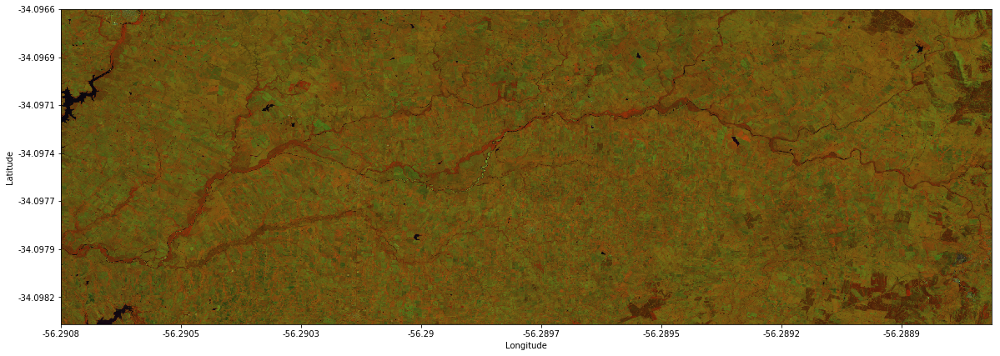

In [12]:
rgb(composite, bands= ["nir","swir1","blue"], width= 20)

In [13]:
features = composite # Alias the composite.

# Declare a few plotting utility functions

In [14]:
def select_pixels_from_dataarray_using_pandas_array(ds,
                                                    pandas_array = None,
                                                    latitude_name = None,
                                                    longitude_name = None,
                                                    land_cover_name = None):
    
    landcover_names = list(pandas_array.groupby(land_cover_name).size().index)
    training_dict   = {name: [] for name in landcover_names}
    pandas_rows     = [x[1] for x in pandas_array.iterrows()]

    for point_data in pandas_rows:
        training_dict[point_data[land_cover_name]].append(
            float(ds.sel(latitude  = point_data[latitude_name],
                         longitude = point_data[longitude_name],
                         method = 'nearest')))
    data_list = []
    target_list = []
    ordered_class_names = []
    for i, name in enumerate(training_dict.keys()):
        ordered_class_names.append(name)
        data_list += training_dict[name]
        target_list += [i]*len(training_dict[name])

    classes = list(map(lambda class_name_index: ordered_class_names[class_name_index], target_list))
    
    return pd.DataFrame({"data": data_list,
                         "landcover": classes})

In [15]:
def plot_feature(da: xr.DataArray, 
                 cmap:str = "terrain",
                 bounds:Tuple[float,float] = None):
    fig, ax = plt.subplots(figsize=(20,5))
    ax.set_aspect('equal')
    
    if not bounds == None:
        da.plot(cmap = cmap, vmin = bounds[0], vmax = bounds[1])
    else:
        da.plot(cmap = cmap)
    

In [16]:
def plot_kde(da: xr.DataArray, 
             df: pd.DataFrame,
             bounds = None,
             hist = True):

    select_pixels = partial(select_pixels_from_dataarray_using_pandas_array,
                            pandas_array   = df,
                            latitude_name  = "Latitude",
                            longitude_name = "Longitude",
                            land_cover_name = "LandUse")

    _data = select_pixels(da)
    _data  = _data .rename(index = str, columns={"data":"tmp"})
    
    
    plt.figure(figsize = (15,5))
    plt.title(da.name)
    for x in [x[0] for x in _data.groupby("landcover").count().iterrows()]:
        _x = _data[_data["landcover"].str.contains(x)]["tmp"].values
        sns.distplot( _x ,  label= str(x), bins = 30, hist = hist)
    
    if not bounds == None:
        plt.xlim(*bounds)
    plt.legend()


In [17]:
def plot_jitter(da, df, bounds = None):
    select_pixels = partial(select_pixels_from_dataarray_using_pandas_array,
                        pandas_array   = df,
                        latitude_name  = "Latitude",
                        longitude_name = "Longitude",
                        land_cover_name = "LandUse")
    _data = select_pixels(da)
    _data = _data.rename(index = str, columns={"data": da.name})
    
    plt.figure(figsize = (15,5))
    
    if not bounds == None:
        plt.xlim(*bounds)
    
    ax = sns.stripplot(x=da.name, y="landcover", data=_data , jitter=True, linewidth=1)

# Feature: NDVI

In [18]:
def NDVI(dataset: xr.Dataset) -> xr.DataArray:
    return (dataset.nir - dataset.red)/(dataset.nir + dataset.red).rename("NDVI")

In [19]:
features["NDVI"] = NDVI(composite)

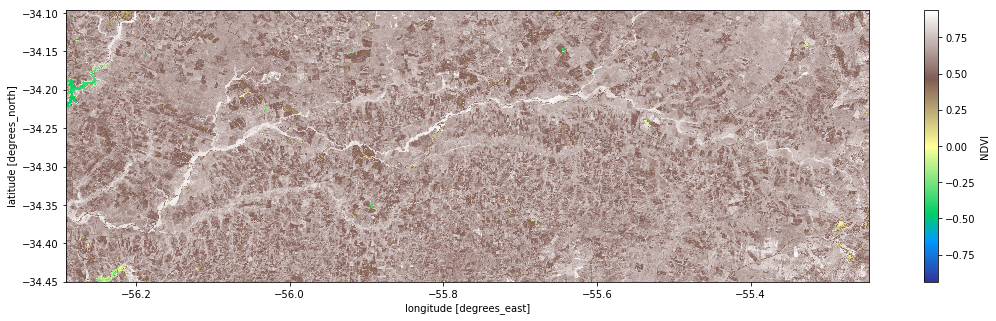

In [20]:
plot_feature(features.NDVI)

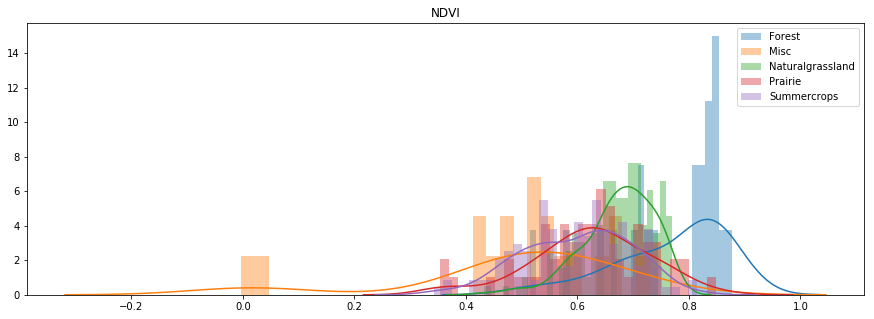

In [21]:
plot_kde(features.NDVI, data, hist = True)

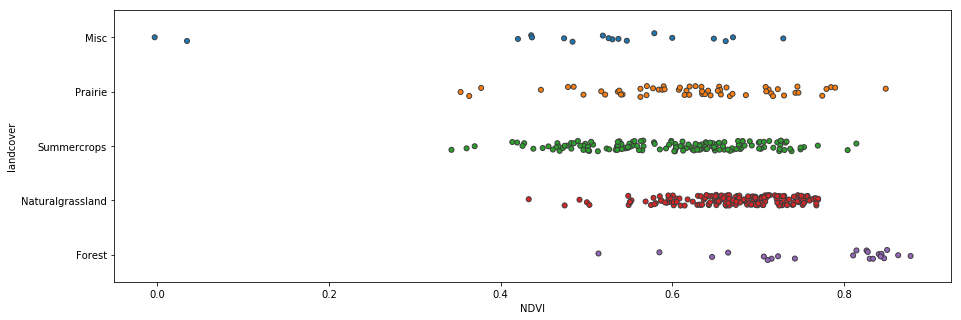

In [22]:
plot_jitter(features.NDVI, data)

# Feature: NBR

In [23]:
def NBR(dataset: xr.Dataset) -> xr.DataArray:
    return ((dataset.nir - dataset.swir2) / (dataset.swir2 + dataset.nir)).rename("NBR")

In [24]:
features["NBR"] = NBR(composite)

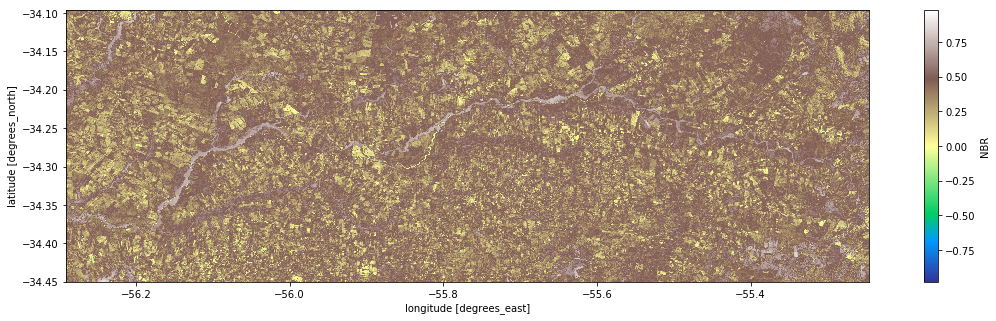

In [25]:
plot_feature(features.NBR)

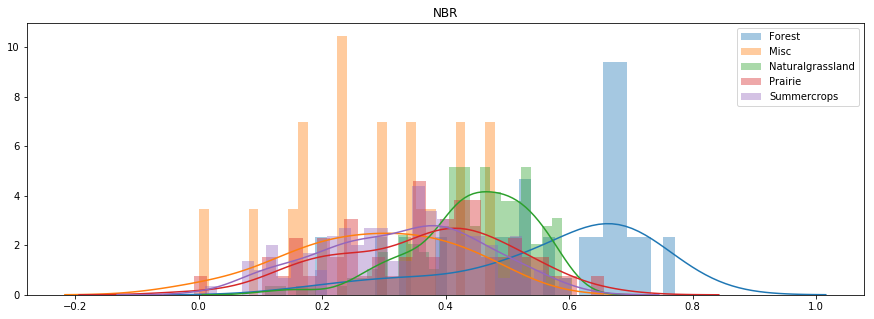

In [26]:
plot_kde(features.NBR, data)

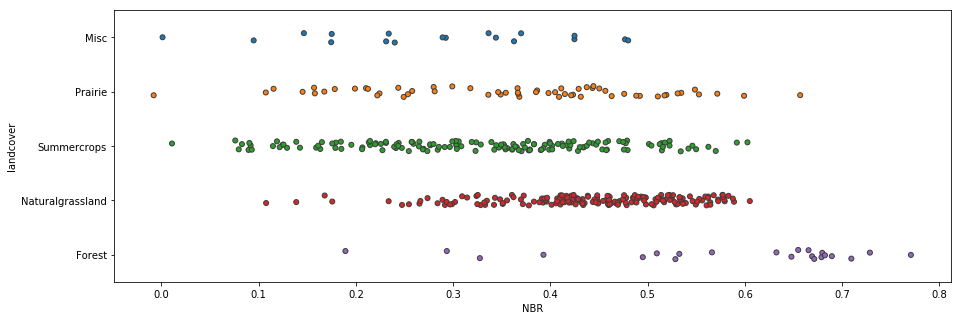

In [27]:
plot_jitter(features.NBR, data) 

# Feature: NDWI_2

In [28]:
def NDWI_2(dataset: xr.Dataset) -> xr.DataArray:
    return (dataset.green - dataset.nir)/(dataset.green + dataset.nir).rename("NDWI_2")

In [29]:
features["NDWI_2"] = NDWI_2(composite)

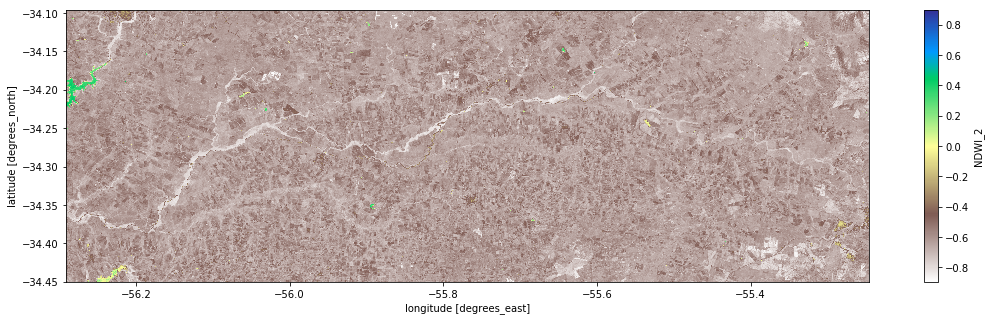

In [30]:
plot_feature(features.NDWI_2, cmap = "terrain_r")

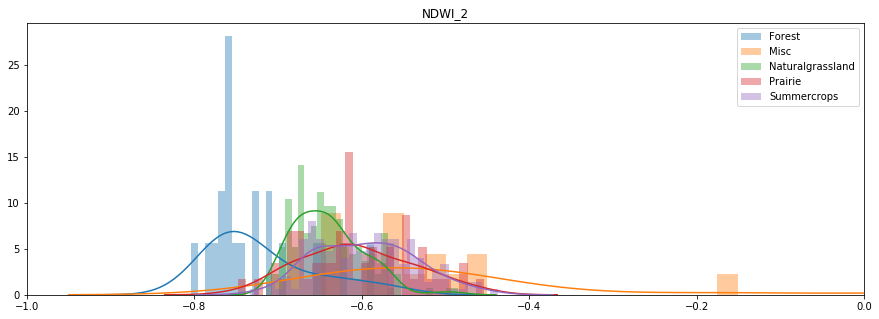

In [31]:
plot_kde(features.NDWI_2, data, hist = True, bounds = (-1, 0))

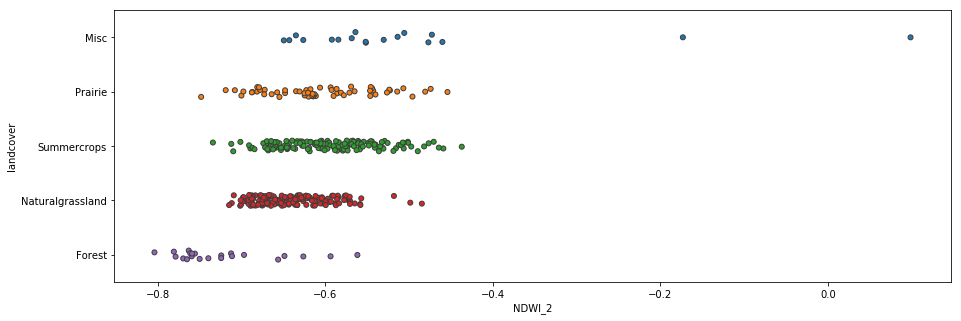

In [32]:
plot_jitter(features.NDWI_2, data)

# Feature: SCI

In [33]:
def SCI(dataset: xr.Dataset) -> xr.DataArray:
    return ((dataset.swir1 - dataset.nir)/(dataset.swir1 + dataset.nir)).rename("SCI")

In [34]:
features["SCI"] = SCI(composite)

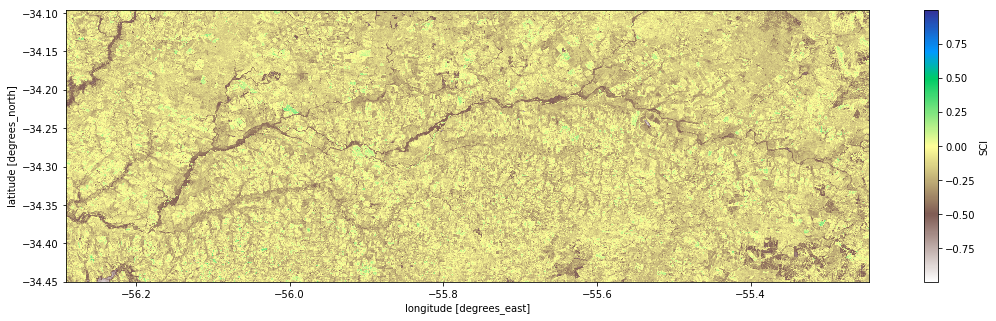

In [35]:
plot_feature(features.SCI, cmap = "terrain_r")

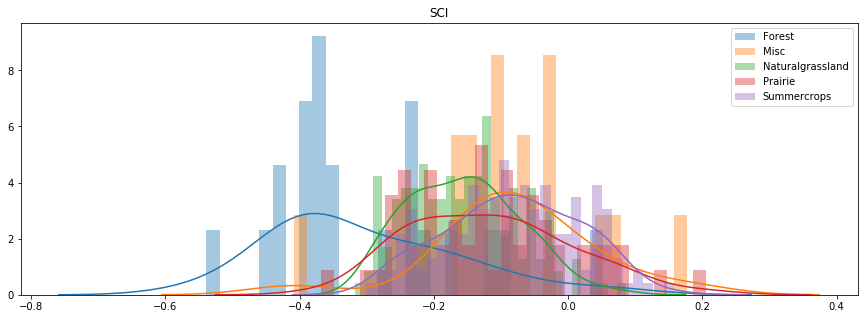

In [36]:
plot_kde(features.SCI, data)

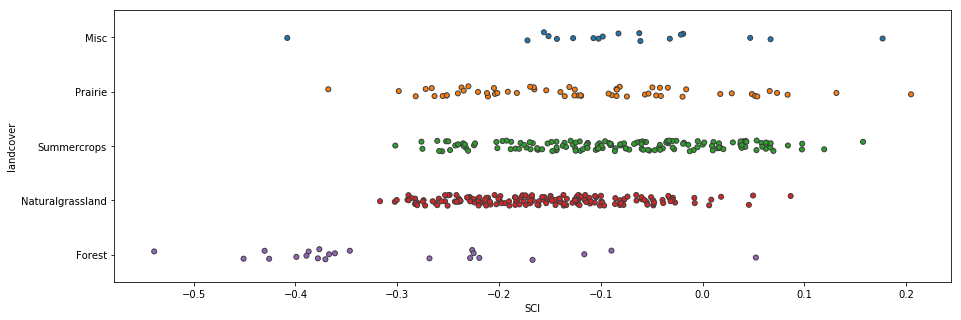

In [37]:
plot_jitter(features.SCI, data)

# Feature: PNDVI

In [38]:
def PNDVI(dataset: xr.Dataset) -> xr.DataArray:
    
    nir = dataset.nir
    green = dataset.green
    blue = dataset.blue
    red = dataset.red
    
    return ((nir - (green + red + blue))/(nir + (green + red + blue))).rename("PNDVI")

In [39]:
features["PNDVI"] = PNDVI(composite)

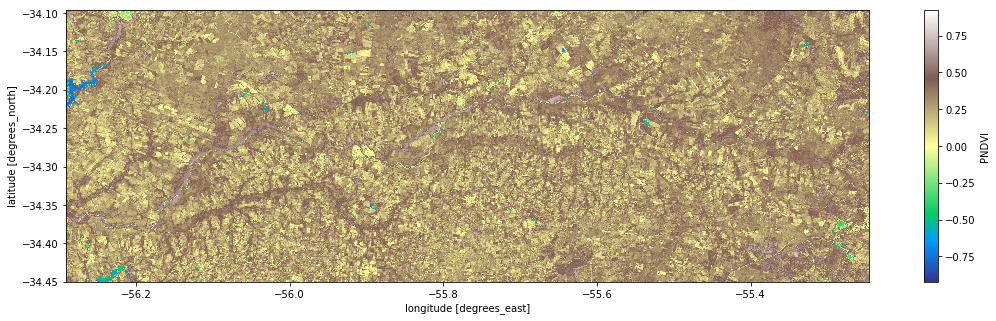

In [40]:
plot_feature(features.PNDVI)

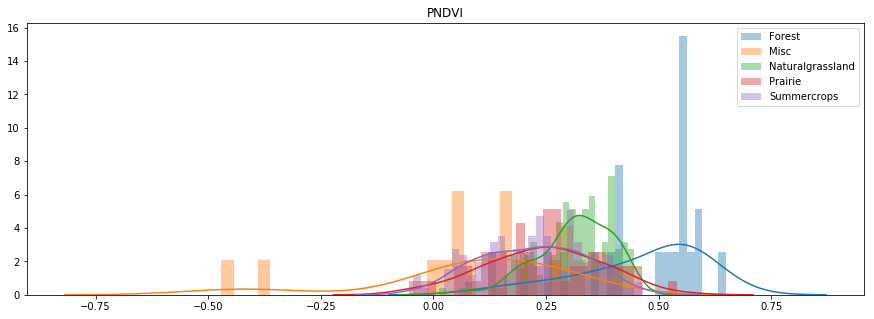

In [41]:
plot_kde(features.PNDVI, data)

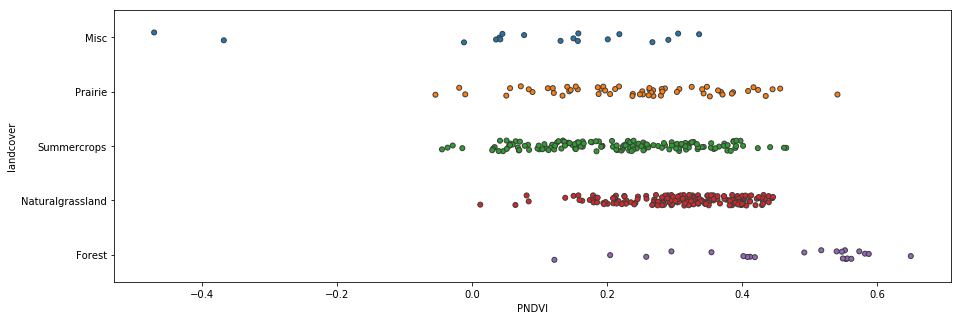

In [42]:
plot_jitter(features.PNDVI, data)

# Feature: CVI

In [43]:
def CVI(dataset: xr.Dataset) -> xr.DataArray:
    return (dataset.nir * (dataset.red / (dataset.green * dataset.green))).rename("CVI")

In [44]:
features["CVI"] = CVI(composite)

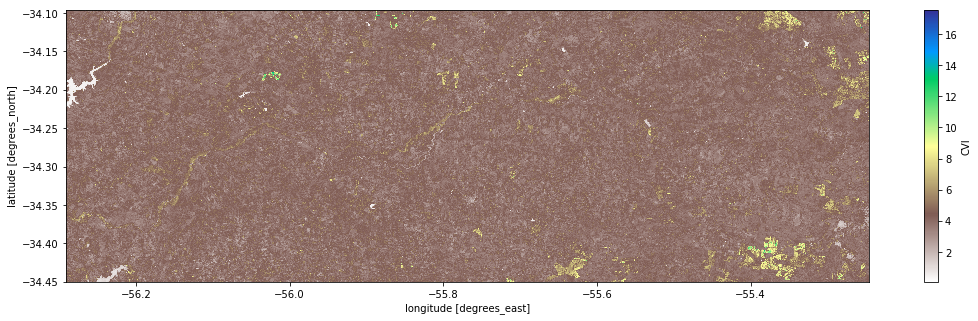

In [45]:
plot_feature(features.CVI, cmap= "terrain_r")

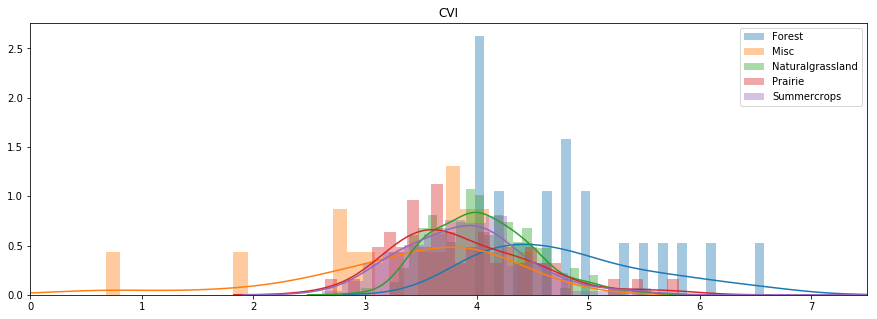

In [46]:
plot_kde(features.CVI, data, bounds = (0, 7.5))

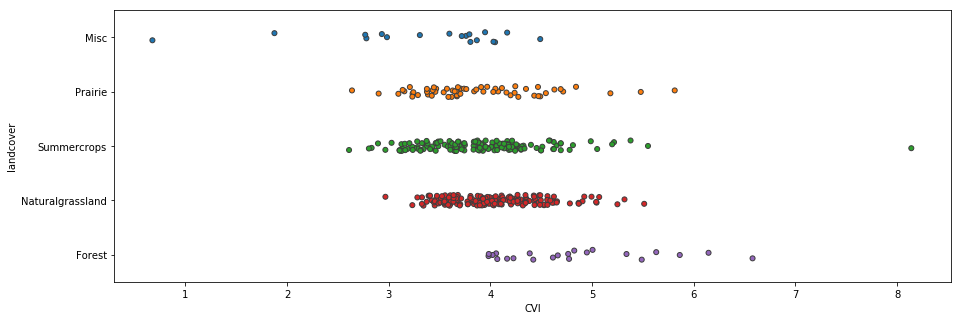

In [47]:
plot_jitter(features.CVI, data)

# Feature: CCCI

In [48]:
def CCCI(dataset: xr.Dataset) -> xr.DataArray:
    return ((dataset.nir - dataset.red)/(dataset.nir + dataset.red)).rename("CCCI")

In [49]:
features["CCCI"] = CCCI(composite)

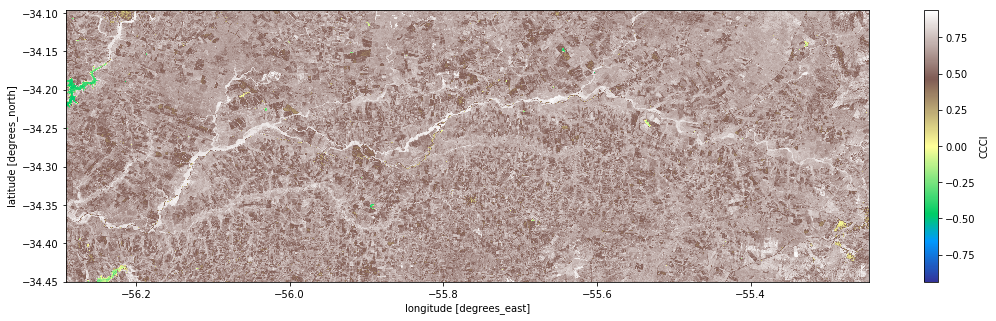

In [50]:
plot_feature(features.CCCI)

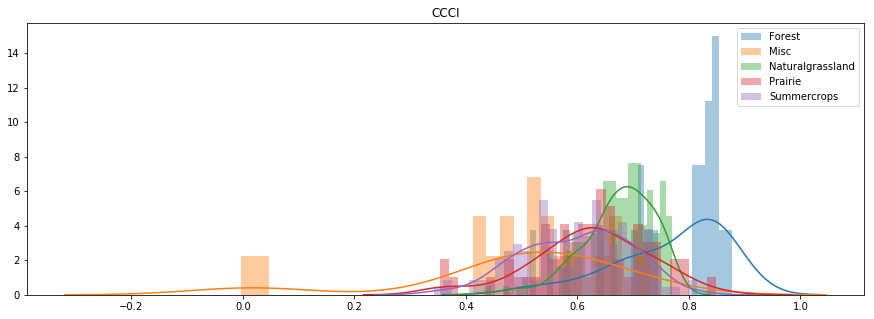

In [51]:
plot_kde(features.CCCI, data)

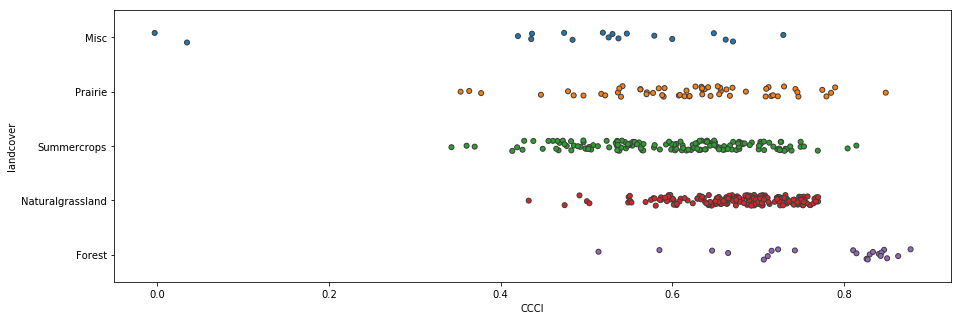

In [52]:
plot_jitter(features.CCCI, data)

# Feature: NBR2

In [53]:
def NBR2(dataset: xr.Dataset) -> xr.DataArray:
    return (dataset.swir1 - dataset.swir2)/(dataset.swir1 + dataset.swir2)

In [54]:
features["NBR2"] = NBR2(composite)

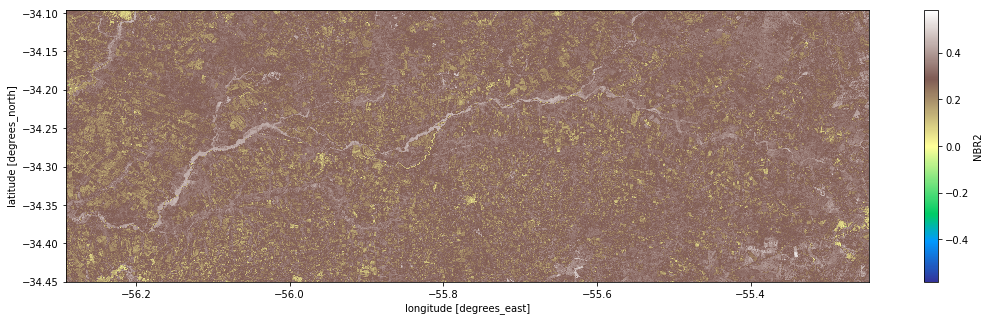

In [55]:
plot_feature(features.NBR2)

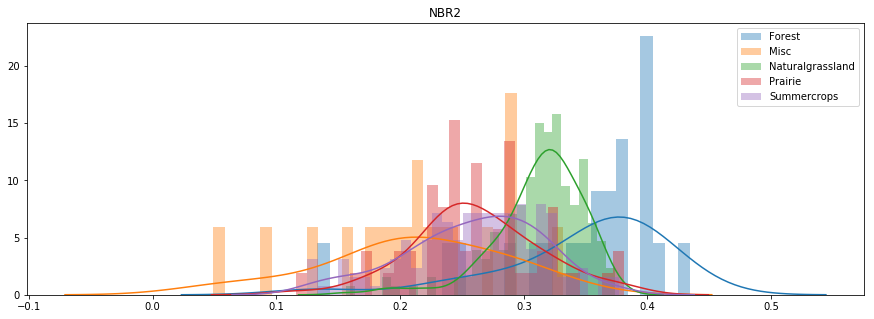

In [56]:
plot_kde(features.NBR2, data, hist = True)

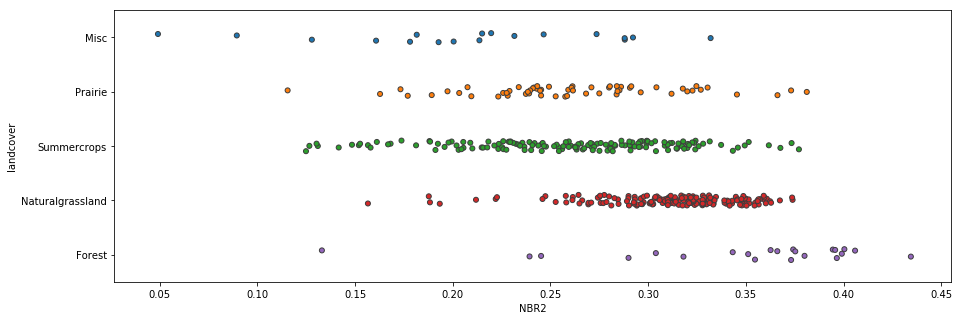

In [57]:
plot_jitter(features.NBR2, data)

# Feature: Bands

In [58]:
bands = [*composite.data_vars.keys()]
bands

['red',
 'green',
 'blue',
 'nir',
 'swir1',
 'swir2',
 'NDVI',
 'NBR',
 'NDWI_2',
 'SCI',
 'PNDVI',
 'CVI',
 'CCCI',
 'NBR2']

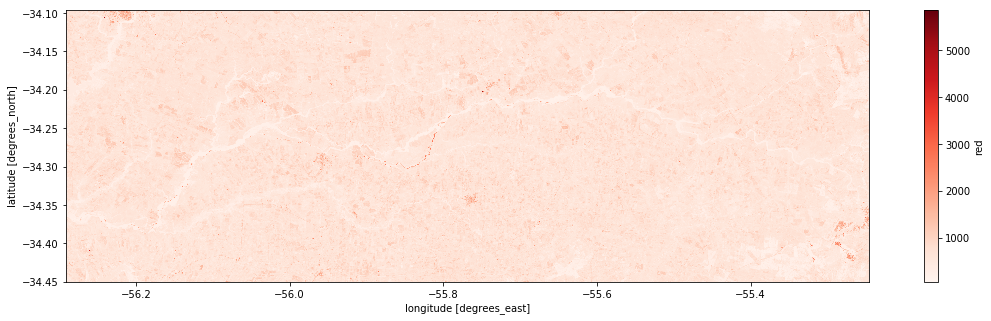

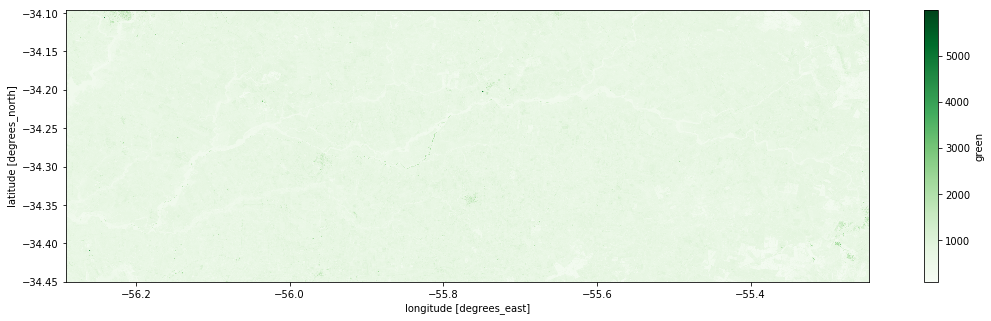

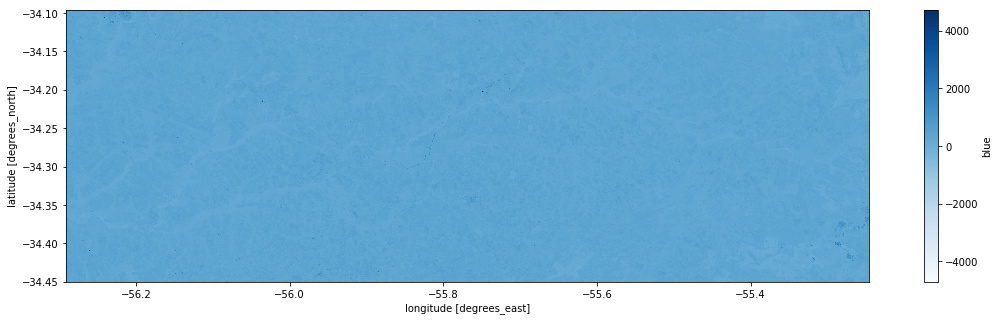

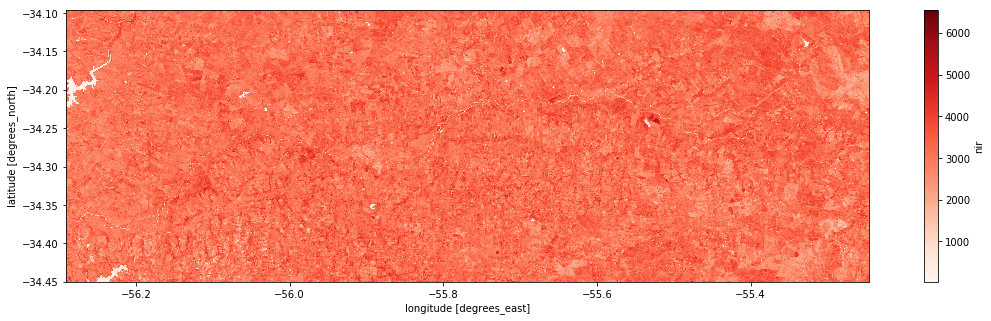

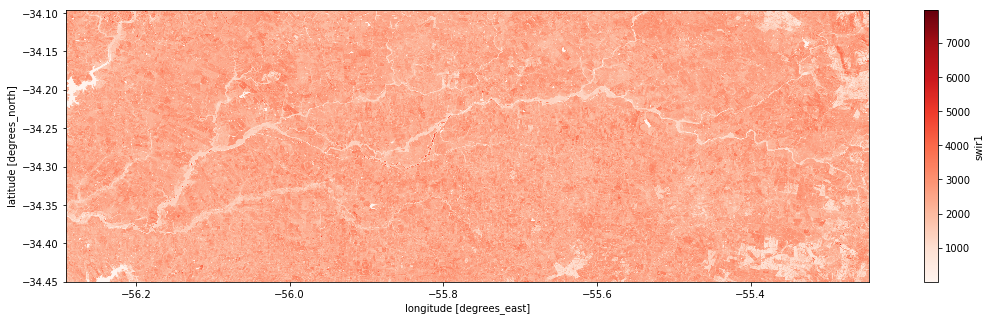

...

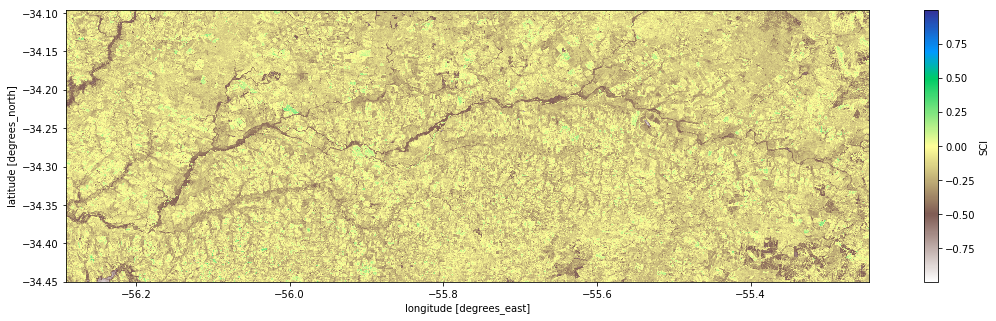

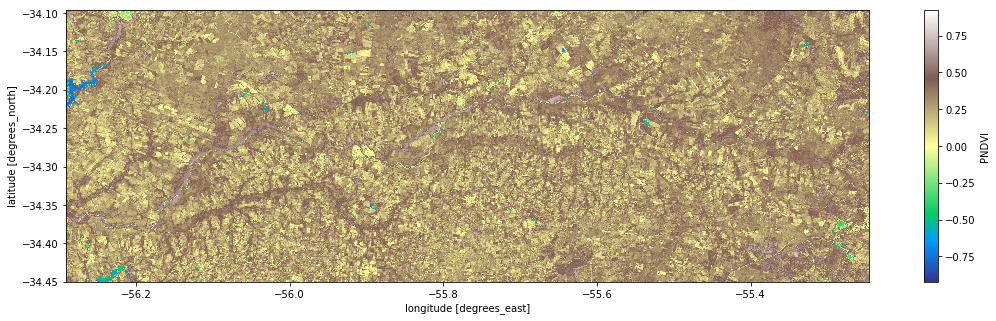

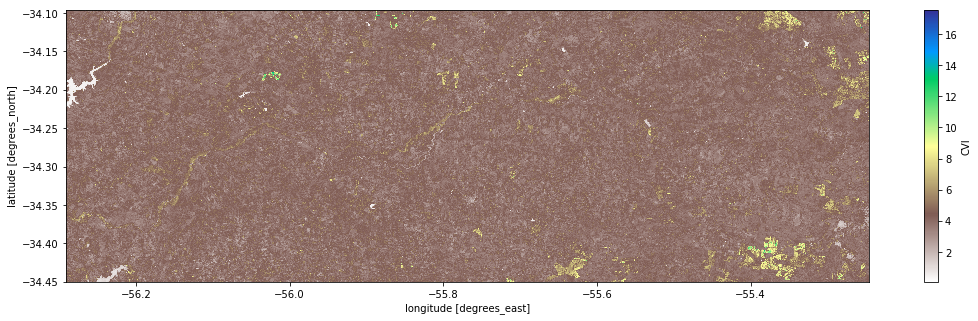

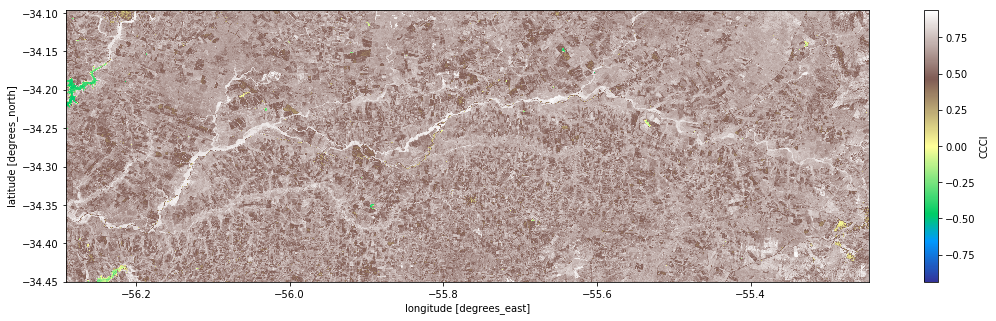

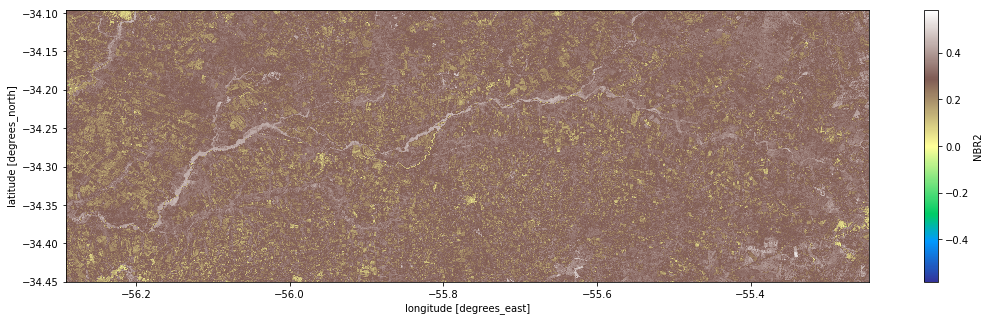

In [59]:
for band in bands:
    if band in ['red', 'nir', 'swir1', 'swir2']:
        cmap = 'Reds'
    elif band == 'green':
        cmap = 'Greens'
    elif band == 'blue':
        cmap = 'Blues'
    elif band in ['NDWI_2', 'SCI', 'CVI']:
        cmap = 'terrain_r'
    else:
        cmap = 'terrain'
    plot_feature(features[band], cmap=cmap)
    plt.show()

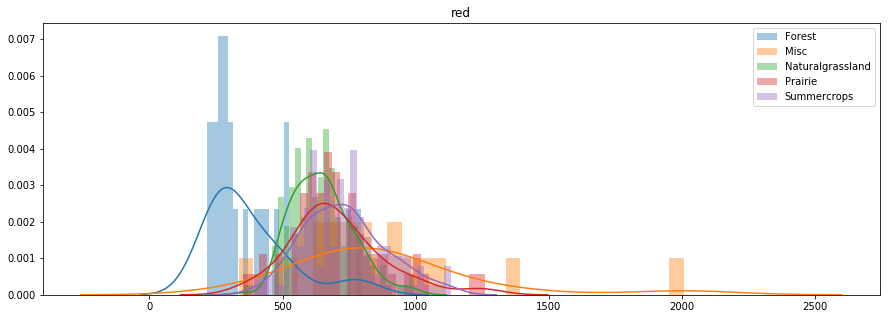

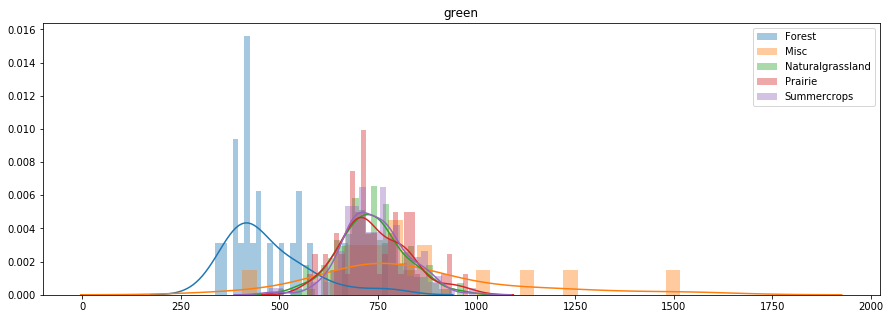

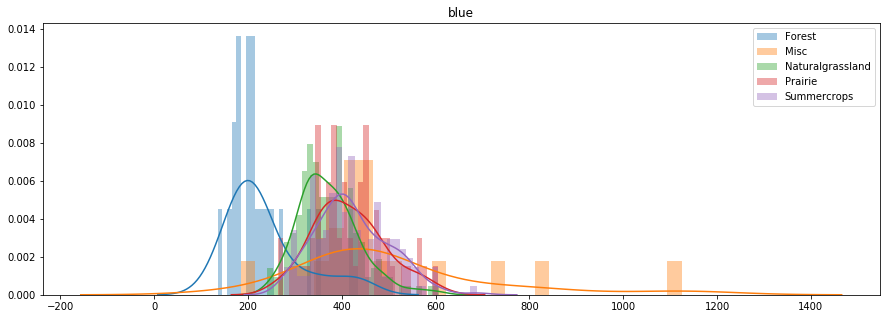

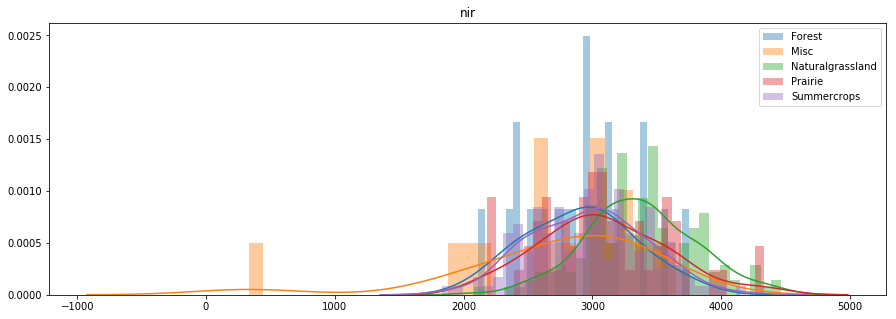

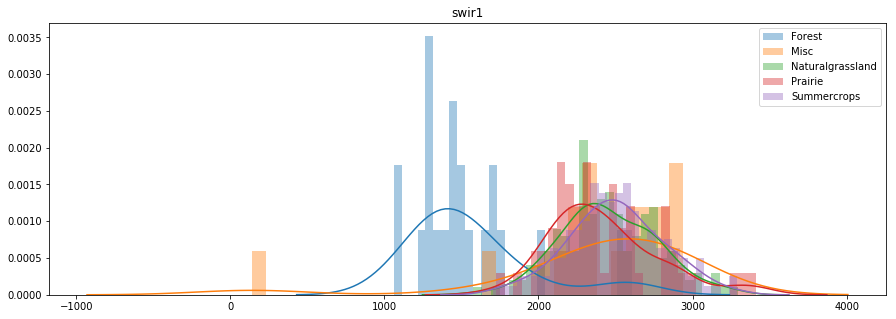

...

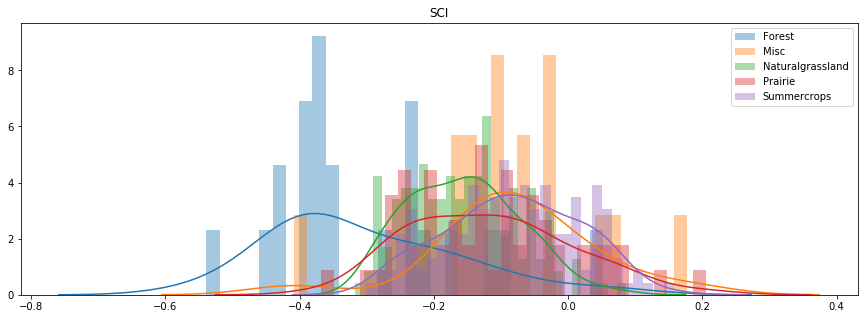

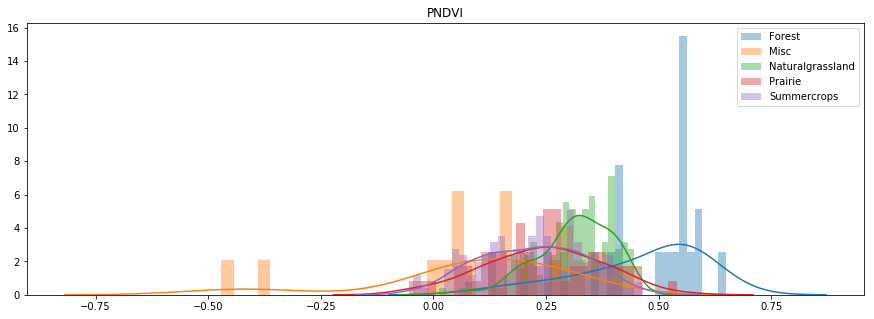

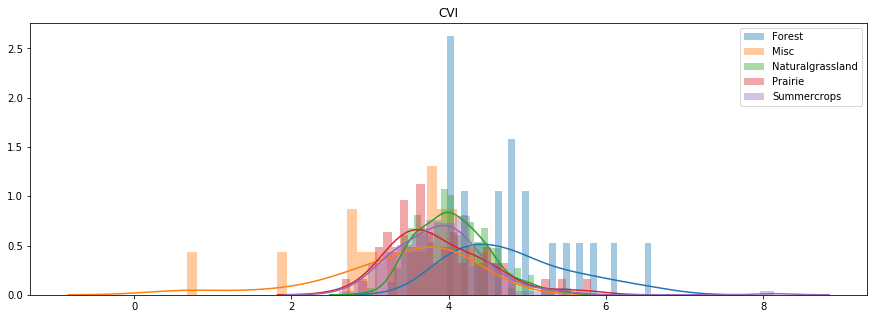

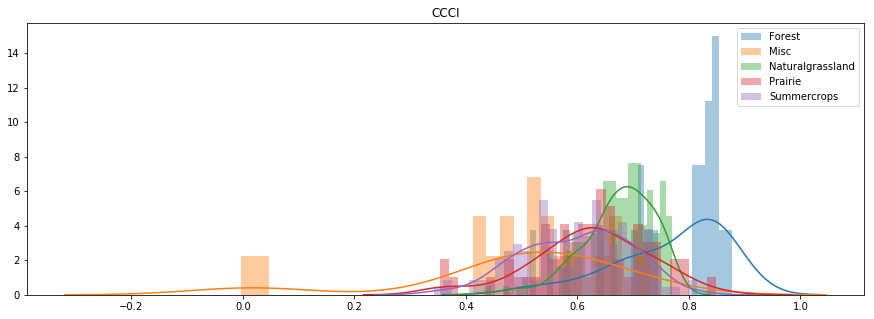

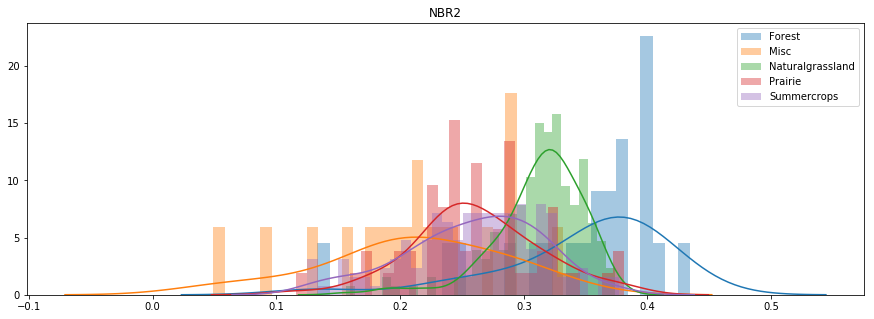

In [60]:
for band in bands: 
    plot_kde(features[band], data)

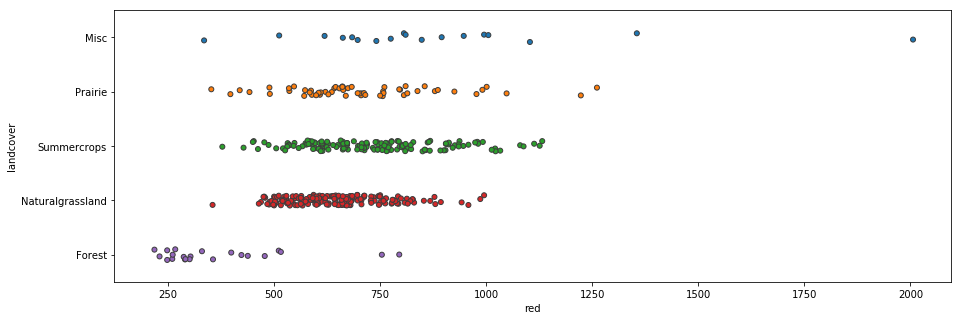

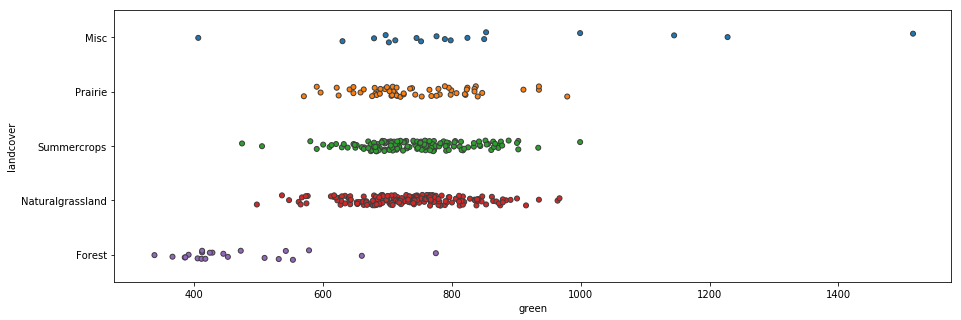

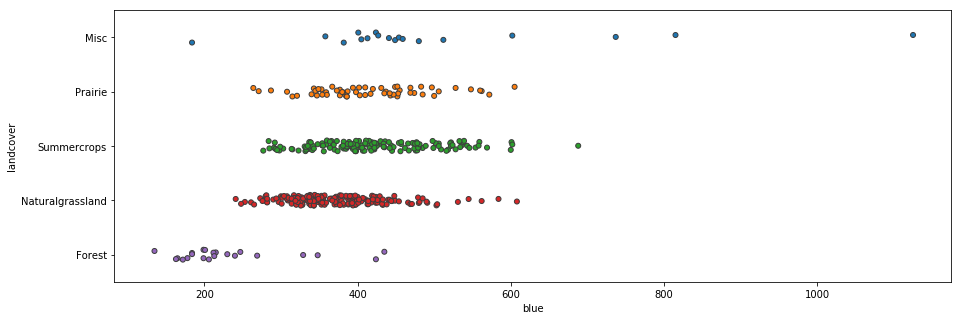

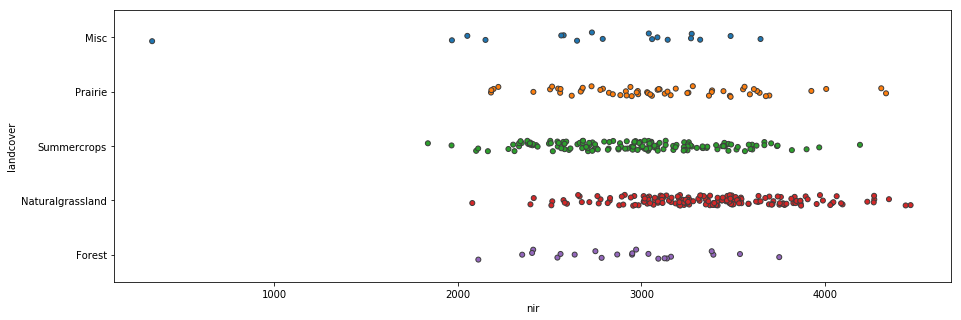

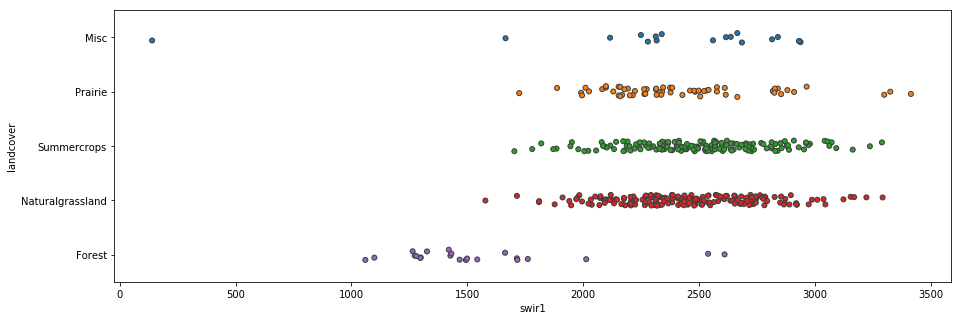

...

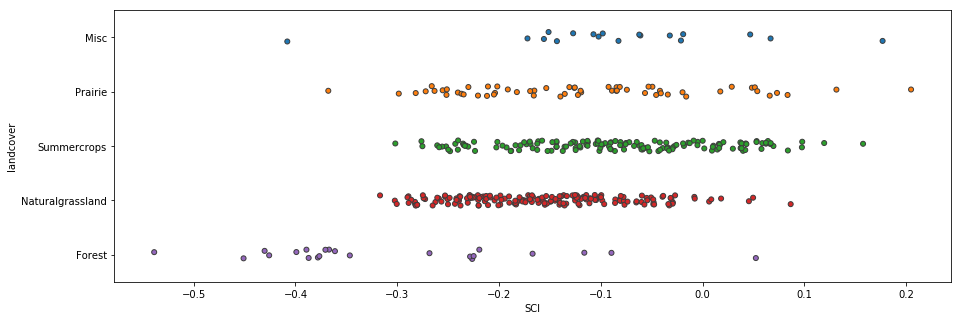

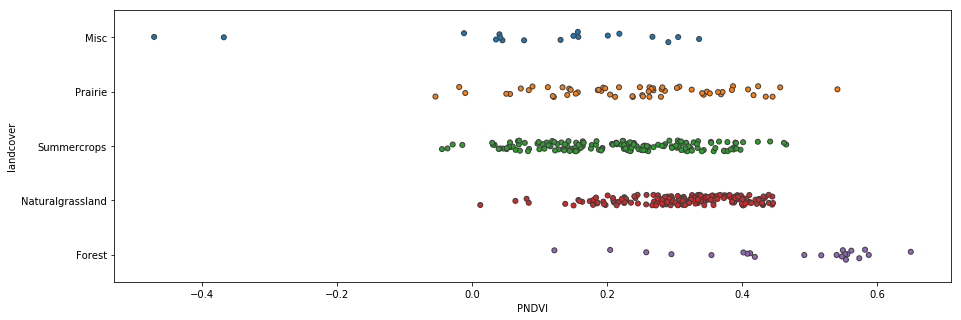

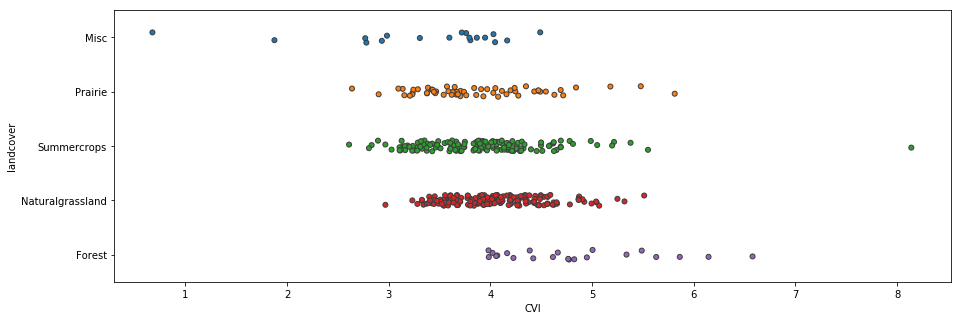

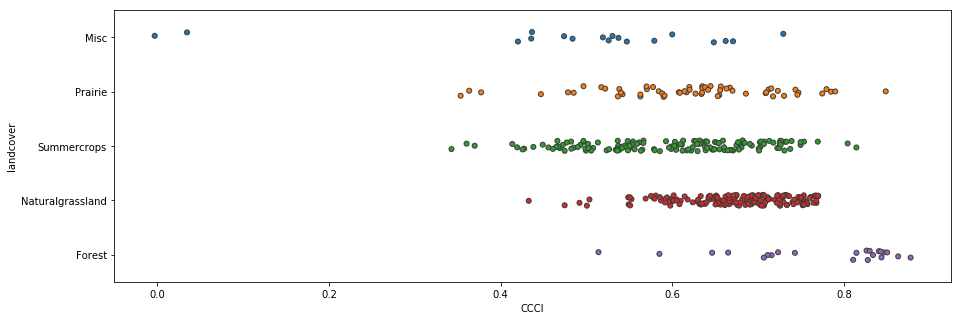

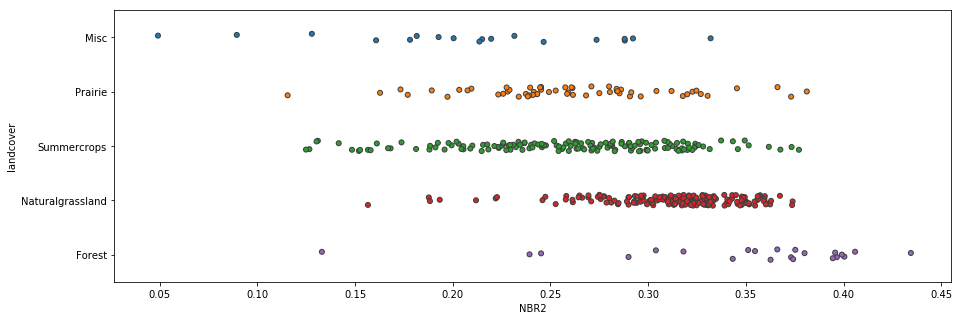

In [61]:
for band in bands: 
    plot_jitter(features[band], data)

# Spectral Unmixing

**fractional cover algorithm**

In [62]:
def fractional_cover_2d(dataset: xr.Dataset) -> xr.DataArray:
    return  frac_coverage_classify(dataset, clean_mask= np.ones(dataset.red.values.shape).astype(bool))

In [63]:
features = features.merge(fractional_cover_2d(composite))

../../utils/data_cube_utilities/dc_frac.py:78: RuntimeWarning: invalid value encountered in log
  band_stack = np.hstack((band_stack, np.expand_dims(np.log(band_stack[:, b]), axis=1)))


# Feature: Fractional Coverage Bare Soil  

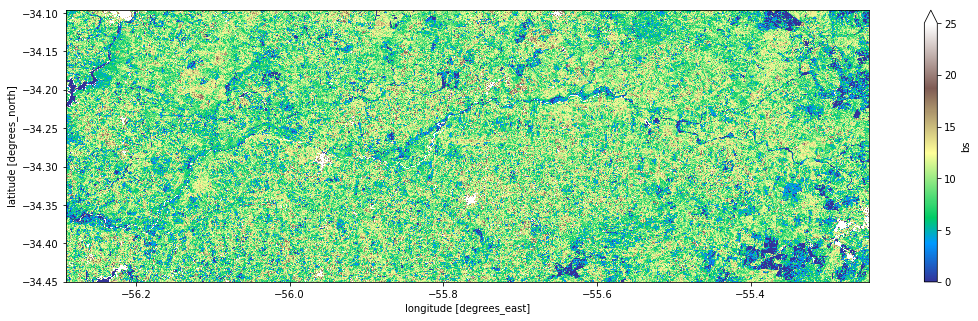

In [64]:
plot_feature(features.bs, bounds=(0,25), cmap = "terrain")

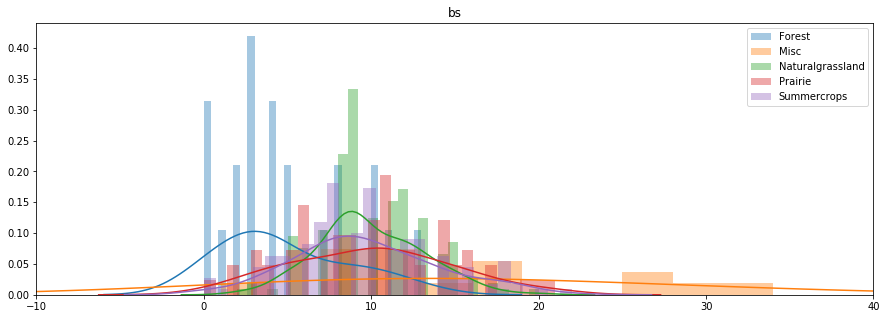

In [65]:
plot_kde(features.bs, data, bounds = (-10, 40))

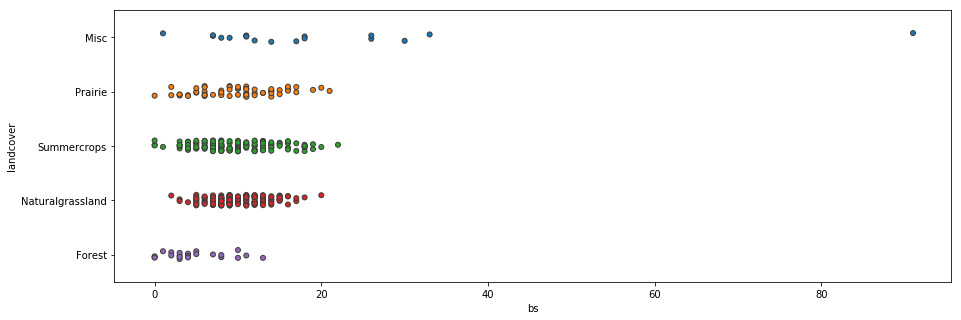

In [66]:
plot_jitter(features.bs, data)

# Feature: Fractional Coverage Photosynthetic Vegetation

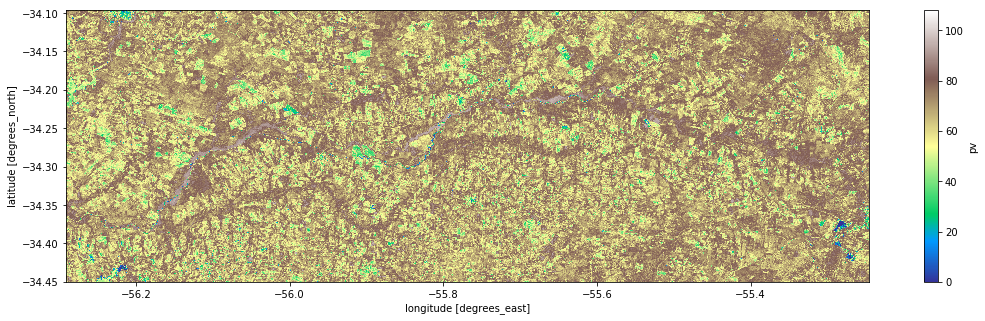

In [67]:
plot_feature(features.pv)

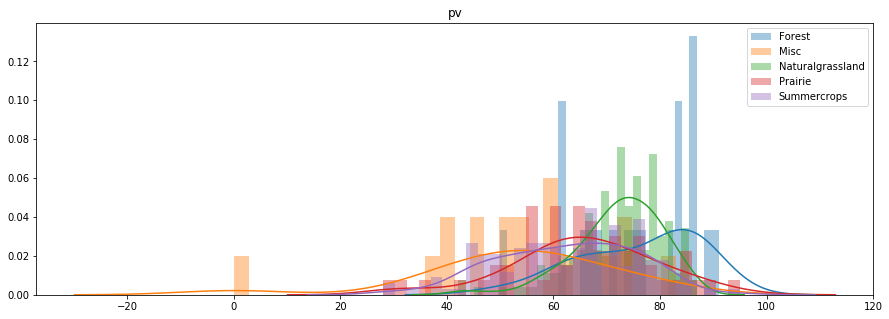

In [68]:
plot_kde(features.pv, data)

# Feature: Fractional Coverage Non photosynthetic vegetation

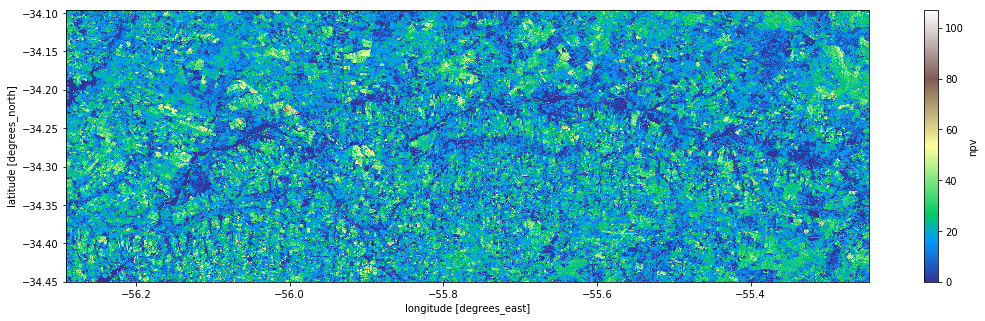

In [69]:
plot_feature(features.npv, cmap = "terrain")

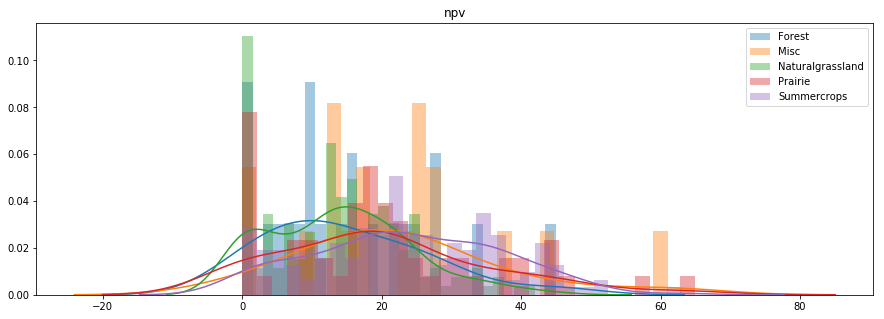

In [70]:
plot_kde(features.npv, data)

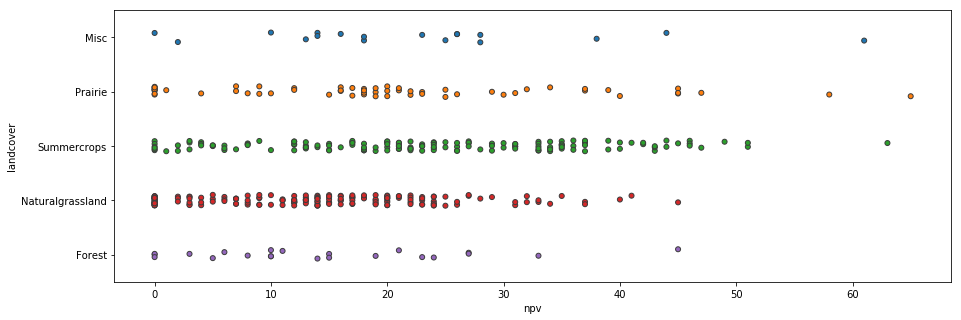

In [71]:
plot_jitter(features.npv, data)

# Statistical Composite

In [72]:
def coefficient_of_variance(da:xr.DataArray):
    return da.std(dim = "time")/da.mean(dim = "time")   

# Feature: Coefficient of Variance on NDVI

In [73]:
def coefficient_of_variance_NDVI(ds, mask = None):
    ds_ndvi = NDVI(ds)    
    masked_ndvi = ds_ndvi.where(mask)
    return coefficient_of_variance(masked_ndvi)    

In [74]:
clean = clean_mask_ls8(dataset)
features["NDVI_coeff_var"] = coefficient_of_variance_NDVI(dataset, mask = clean)

/home/localuser/Datacube/datacube_env/lib/python3.5/site-packages/numpy/lib/nanfunctions.py:1315: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe')


**Replace NaN**

In [75]:
print(type(np.finfo(np.float32).max))

<class 'numpy.float32'>


In [76]:
# NaNs here should be a result of dividing by zero, so replace with highest possible number.
features.NDVI_coeff_var.values[ np.isnan(features.NDVI_coeff_var.values)] = np.finfo(np.float32).max

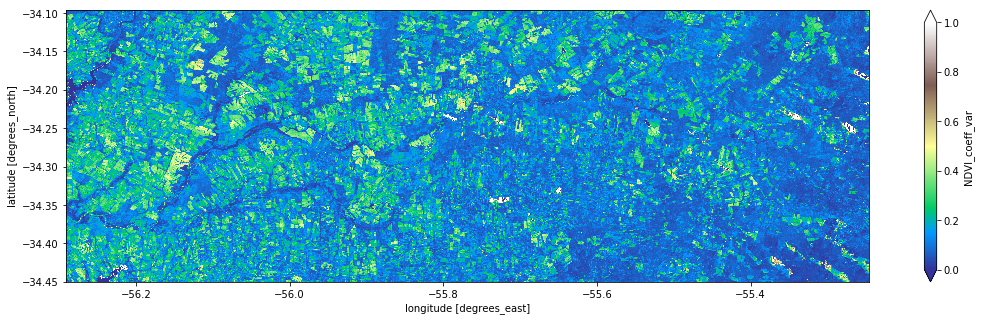

In [77]:
plot_feature(features.NDVI_coeff_var, bounds = (0,1), cmap = "terrain")

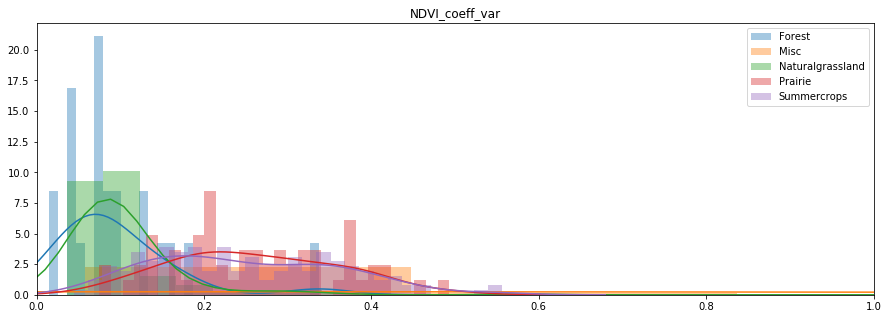

In [78]:
plot_kde(features.NDVI_coeff_var,data, bounds = (0,1))

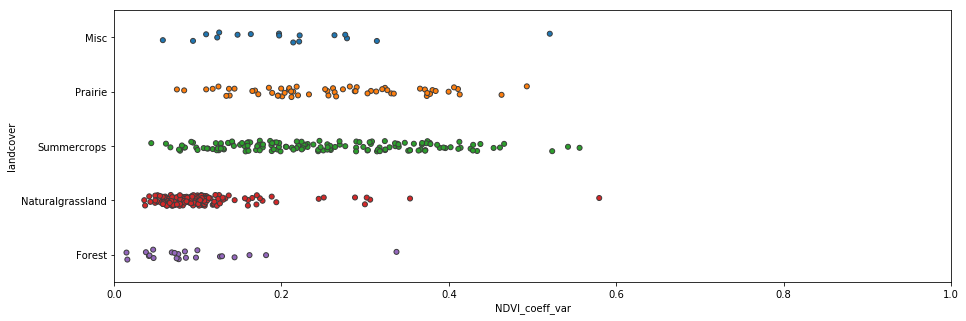

In [79]:
plot_jitter(features.NDVI_coeff_var, data, bounds = (0,1))

# Comparing Features

## SSIM Matrix
An SSIM (Structural Similarity Matrix) shows the similarity between all pairs of features.

In [80]:
feature_names = features.data_vars

d = {k:{} for k in feature_names}
dd = {k: d.copy() for k in feature_names}

names = [*product(feature_names, feature_names)]
fns = map(lambda i: names[i], tqdm_notebook(range(len(names))))

for feature_name_a, feature_name_b in fns:
    feature_a = features[feature_name_a].values
    feature_b = features[feature_name_b].values 
    feature_a = feature_a.astype(float)
    feature_b = feature_b.astype(float)
    
    dd[feature_name_a][feature_name_b] =ssim(feature_a, feature_b)

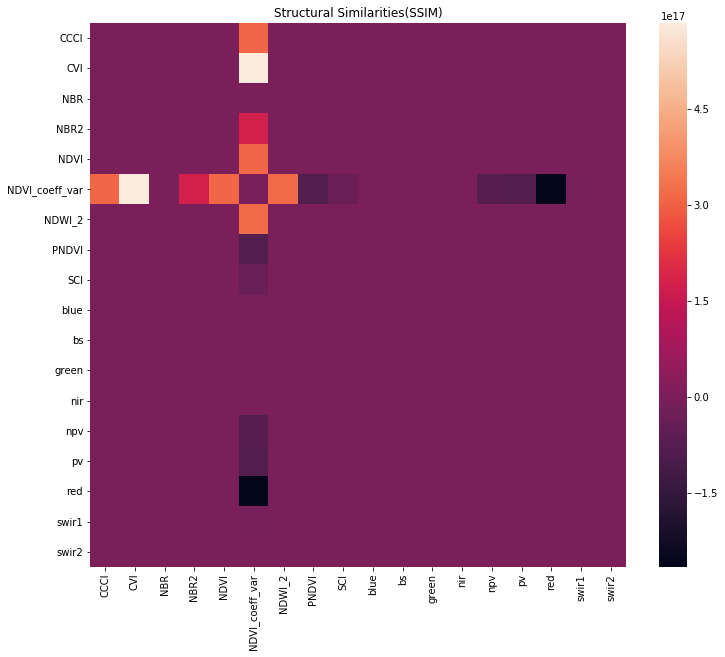

In [81]:
plt.figure(figsize = (12,10))
plt.title("Structural Similarities(SSIM)")

sns.heatmap(pd.DataFrame(dd))
plt.show()

# Export Features

In [82]:
OUTPUT_PATH = "./engineered_features.csv"

In [ ]:
data.head()

,Unnamed: 0,X,Y,LandUse,Latitude,Longitude
0,0,618522.8899,6218452.029,Forest,-34.168155,-55.714061
1,1,649042.3861,6199719.402,Forest,-34.333113,-55.379803
2,2,655993.6095,6200009.045,Forest,-34.329479,-55.304319
3,3,656440.0958,6200236.666,Forest,-34.327360,-55.299509
4,4,656825.7859,6199755.161,Forest,-34.331642,-55.295231


** Build an exportable Pandas.DataFrame datastructure with features**

In [ ]:
def select_a_pixel(row, data_array:xr.DataArray = None):
    lat = row["Latitude"]
    lon = row["Longitude"]  
    return data_array.sel(latitude = lat, longitude = lon, method = "nearest").values

df = data.copy()
for feature_name in features.data_vars:
    select_from_data_array = partial(select_a_pixel, data_array = features[feature_name])
    feature_column = df.apply(select_from_data_array, axis = 1)
    # Preserve the data type.
    original_dtype = features[feature_name].dtype
    feature_column = feature_column.astype(original_dtype)
    df = df.join(pd.DataFrame(feature_column, columns = [feature_name]))

**Export**

In [ ]:
df.to_csv(OUTPUT_PATH)

In [ ]:
!ls